# Task1 : Movie Genre Classification
    We are tasked to design an Movie Genre classifier based on previous movie data in this jupyter notebook we are going to
    create a machine learning model that can predict the genre of a movie based on its plot summary or other textual
    information. we are going to use techniques like TF-IDF or word embeddings with classifiers such as Naive Bayes,
    Logistic Regression, or Support Vector Machines.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Methodology:

###  1. Data Collection
###  2. Data Cleaning and Preprocessing
###  3. Data Visualization
###  4. Feature Engineering
###  5. Model Selection
###  6. Model Training and Evaluation

# Import necessary libraries


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud


In [3]:
import nltk
import os

# Set the custom download path for NLTK data
custom_download_path = '/kaggle/working/nltk_data'

# Make sure the directory exists; if not, create it
os.makedirs(custom_download_path, exist_ok=True)

# Append the custom download path to NLTK data path
nltk.data.path.append(custom_download_path)

# Download NLTK resources to the custom path
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')




[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [4]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

# 1. Data Collection
    

In [5]:
# Read the txt files using pandas

train_data = pd.read_csv("/content/drive/MyDrive/Genre Classification Dataset/train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("/content/drive/MyDrive/Genre Classification Dataset/test_data.txt", delimiter=':::' ,header = None ,engine='python')

test_data_solution  = pd.read_csv("/content/drive/MyDrive/Genre Classification Dataset/test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [6]:
## View train data
print("shape",train_data.shape)
train_data.head()


shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [7]:
## View the test solution data
print("shape",test_data_solution.shape)
test_data_solution.head()

shape (54200, 4)


,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [8]:
## We will concat the test and train file

df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [9]:
## Check the size
df.shape

(108414, 4)

# 2. Data Cleaning and Preprocessing
    We will clean and preprocess the data
    - Removing duplicates
    - Removing Nan rows and column
    - Preprocessing the Data
    

In [10]:
## Check for Duplicates and Remove them
df.duplicated().sum() ## Will give us a number of duplicates

df.drop_duplicates(inplace = True)  ## Will drops any duplicates

In [11]:
## Check for nan values

df.isna().sum()  # Will check for any duplicates

df.dropna( inplace = True ) ## Will drop any nan containing row if exists

In [12]:
## Check the size
df.shape

(108414, 4)

In [13]:
## function to preprocess the data
stopword = set(stopwords.words('english'))

def preprocessing(text):
    # Convert text to lowercase
    text = text.lower()

    # Remove punctuation using regular expressions
    text = re.sub(r'[^\w\s]', '', text)

    # Remove specific characters #, @, and $
    text = re.sub(r'[#@\$]', '', text)

    # tokenize and convert to list
    tokens = word_tokenize(text)

    ## Lemmatize it
    lemmatizer  = WordNetLemmatizer()

    ## lemmatize each token
   # text = [lemmatizer.lemmatize(token) for token in tokens]
    text = text.split()

    text = [word for word in text if word not in stopword]


    return " ".join(text)



In [14]:
## Create list of words in discription column
df["Despcription_clean"] =  df["Description"].apply(preprocessing)

In [15]:
df.head()

,id,Title,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


# 3. Data Visualization
    Will try to analyse the data using Histogram and Bar Chart.
    And will show word cloud for each genre.
    

In [16]:
## Shows us the label counts
df["Genre"].value_counts()

 drama           27225
 documentary     26192
 comedy          14893
 short           10145
 horror           4408
 thriller         3181
 action           2629
 western          2064
 reality-tv       1767
 family           1567
 adventure        1550
 music            1462
 romance          1344
 sci-fi           1293
 adult            1180
 crime            1010
 animation         996
 sport             863
 talk-show         782
 fantasy           645
 mystery           637
 musical           553
 biography         529
 history           486
 game-show         387
 news              362
 war               264
Name: Genre, dtype: int64

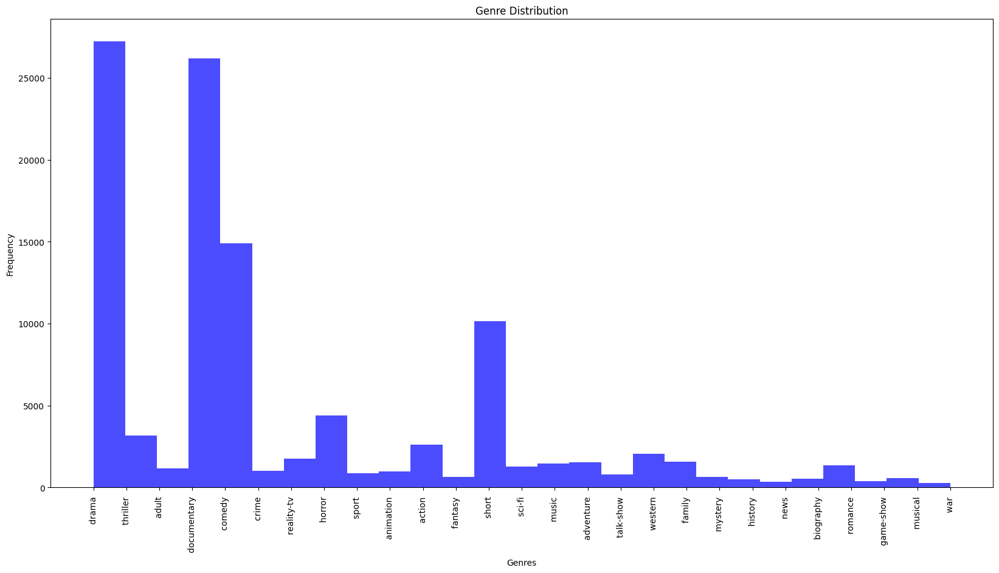

In [17]:
# Create a histogram of genre distribution
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

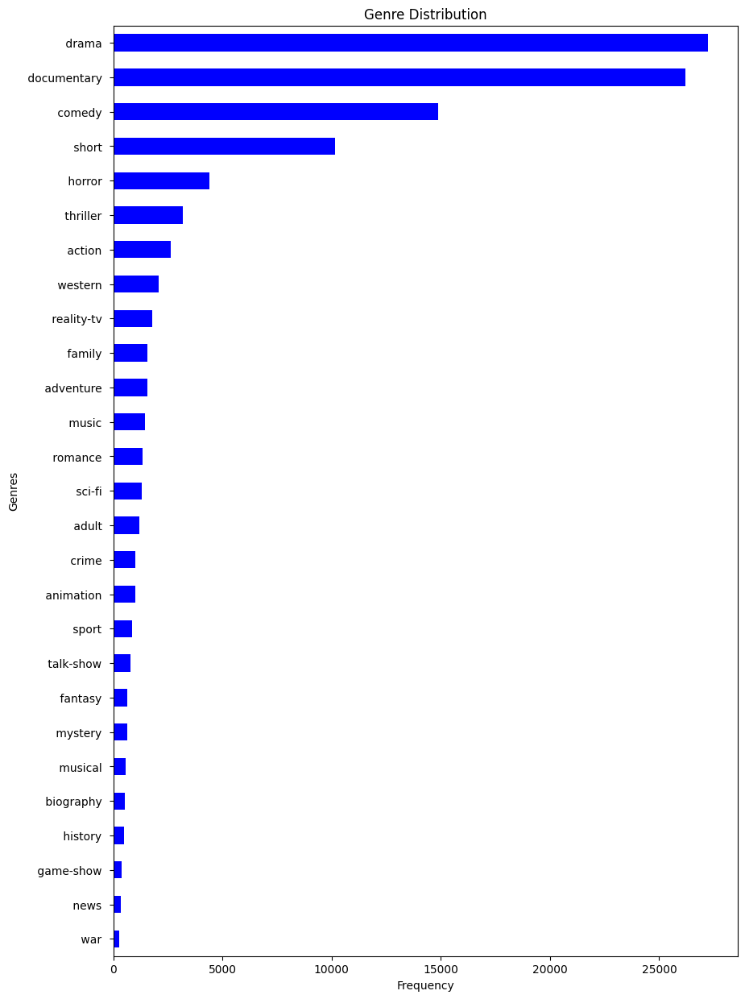

In [18]:
## View genre distribution on Horizontal graph

genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)
# Create a horizontal histogram of genre distribution
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

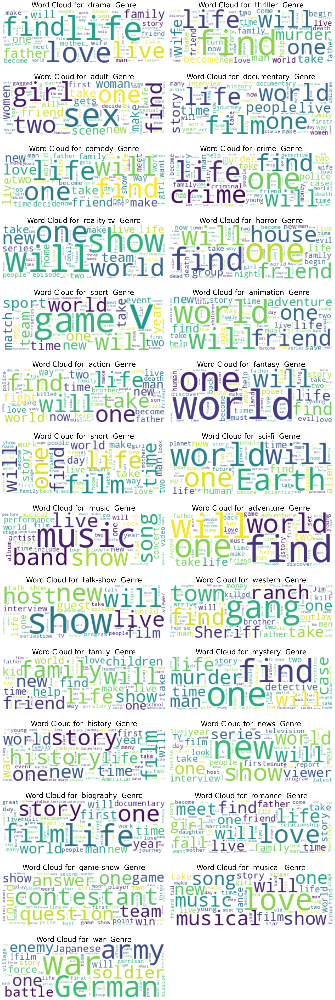

In [19]:
## Below code will generate wordcloud of each genre

# Create a list of unique genres from the dataset
genres = df['Genre'].unique()

# Set the figure size outside the loop
plt.figure(figsize=(20, 60))

# Iterate over each genre
for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  # Assuming you have 14 rows and 2 columns for 28 genres
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')


plt.tight_layout()
plt.show()


# 4. Feature Engineering
      In this step we will remove unnecessary column which are not necessary for our model

In [20]:
## remove id column from head
data = df.drop(["Title","id"] , axis = 1) # will drop column
data.head()


,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


# 5. Model Selection & Training
  - In this section we will try to apply CountVectorizer and TF-IDF technique and try to predict accuracy on model.

### Importing necessary libraries for model selection and training

In [21]:
## import necessary library for
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay


### Converting Genre into Numerical form

In [22]:
#Convert sentiment labels to numerical values for modeling
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [23]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


### Split the data to test and train

In [24]:
## Split the data
x = data["Despcription_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

## Model training using CountVectorizer technique

In [25]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

### MultinomialNB

Model Score on Training data 0.639308576383124
Model Score on Training data 0.5267400889184054
               precision    recall  f1-score   support

      action        0.03      0.69      0.05        52
       adult        0.02      0.77      0.03        13
   adventure        0.07      0.54      0.12        97
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         7
      comedy        0.46      0.53      0.49      6441
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.56      0.69     20748
       drama        0.83      0.47      0.60     24460
      family        0.00      1.00      0.01         3
     fantasy        0.00      0.00      0.00         0
   game-show        0.14      1.00      0.24        27
     history        0.00      0.00      0.00         0
      horror        0.28      0.74      0.40       828
       music        0.05      0.90      0.10        42
     musical        0.00

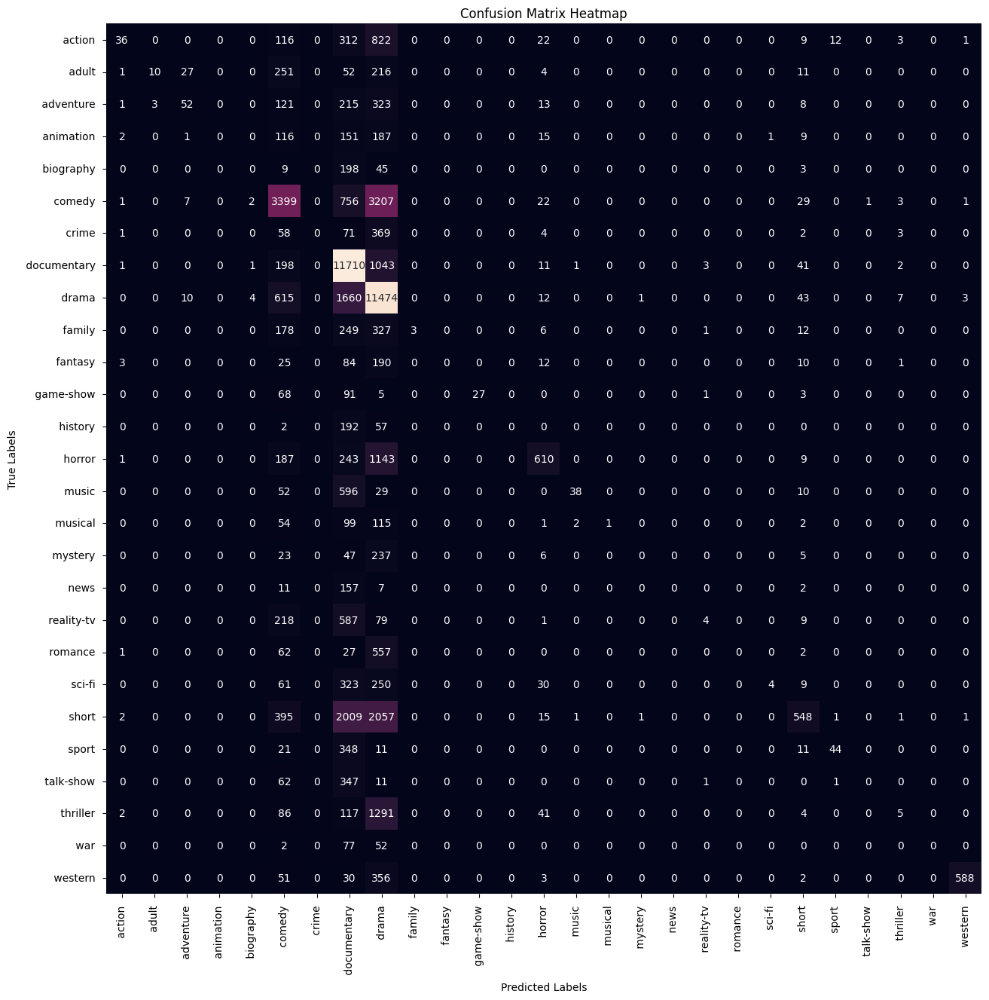

In [26]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()


### LogisticRegression

Model Score on Training data 0.9974173077277843
Model Score on Training data 0.5714575608316269
               precision    recall  f1-score   support

      action        0.33      0.43      0.37      1009
       adult        0.41      0.57      0.48       404
   adventure        0.24      0.39      0.29       447
   animation        0.17      0.44      0.24       188
   biography        0.01      0.08      0.02        37
      comedy        0.59      0.53      0.56      8219
       crime        0.07      0.20      0.11       191
 documentary        0.79      0.71      0.75     14515
       drama        0.68      0.57      0.62     16620
      family        0.16      0.33      0.22       374
     fantasy        0.13      0.40      0.19       102
   game-show        0.64      0.81      0.72       154
     history        0.02      0.10      0.03        50
      horror        0.58      0.62      0.60      2052
       music        0.53      0.65      0.58       596
     musical        0.0

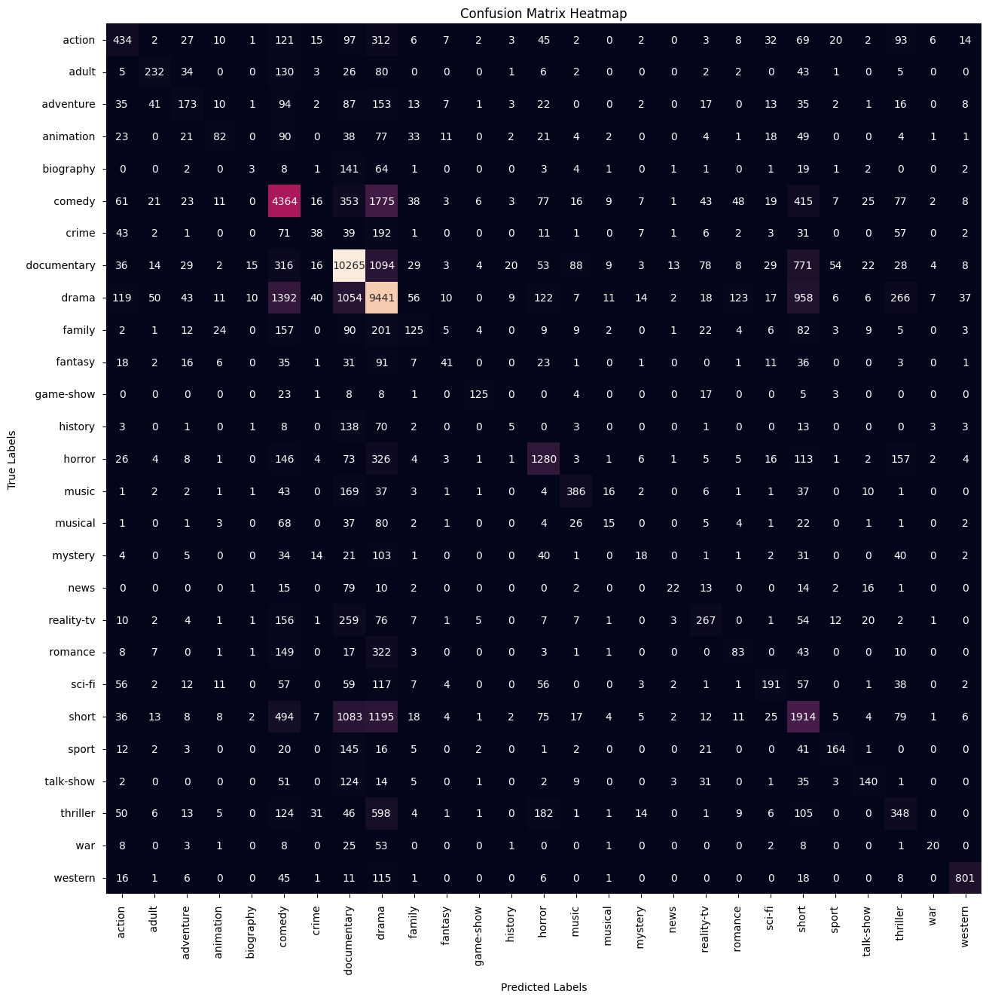

In [27]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### Support Vector Machine ( SVC )

Model Score on Training data 0.9996679395650009
Model Score on Training data 0.5198406109912004
               precision    recall  f1-score   support

      action        0.29      0.33      0.31      1176
       adult        0.42      0.49      0.46       492
   adventure        0.24      0.32      0.27       560
   animation        0.17      0.31      0.22       263
   biography        0.02      0.05      0.03       111
      comedy        0.53      0.50      0.52      7913
       crime        0.06      0.11      0.08       300
 documentary        0.73      0.69      0.71     13743
       drama        0.60      0.54      0.57     15181
      family        0.16      0.24      0.19       518
     fantasy        0.09      0.17      0.12       181
   game-show        0.64      0.68      0.66       184
     history        0.04      0.08      0.05       111
      horror        0.55      0.56      0.55      2144
       music        0.49      0.55      0.52       652
     musical        0.0

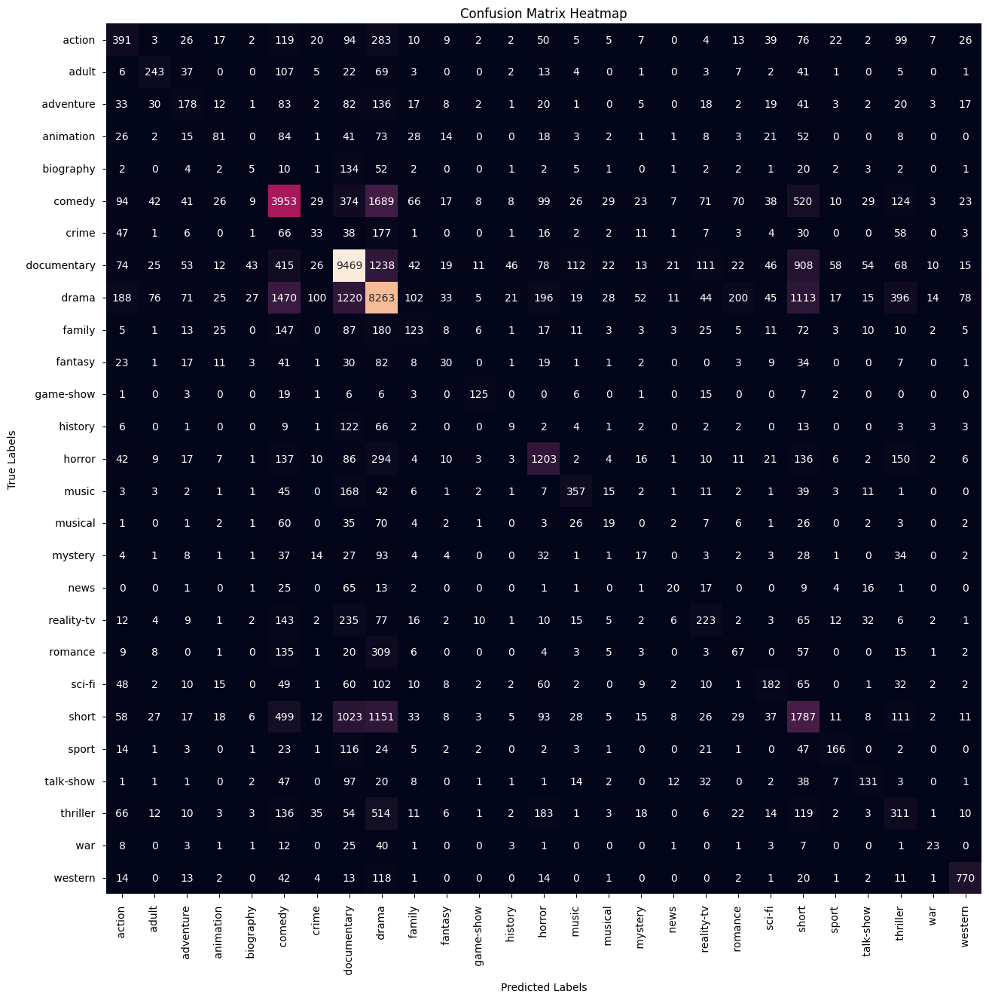

In [28]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

## Now use TfidfVectorizer technique

In [30]:
## Using TfidfVectorizer technique
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)

### MultinomialNB with TfidfVectorizer

Model Score on Training data 0.639308576383124
Model Score on Training data 0.5267400889184054
               precision    recall  f1-score   support

      action        0.03      0.69      0.05        52
       adult        0.02      0.77      0.03        13
   adventure        0.07      0.54      0.12        97
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         7
      comedy        0.46      0.53      0.49      6441
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.56      0.69     20748
       drama        0.83      0.47      0.60     24460
      family        0.00      1.00      0.01         3
     fantasy        0.00      0.00      0.00         0
   game-show        0.14      1.00      0.24        27
     history        0.00      0.00      0.00         0
      horror        0.28      0.74      0.40       828
       music        0.05      0.90      0.10        42
     musical        0.00

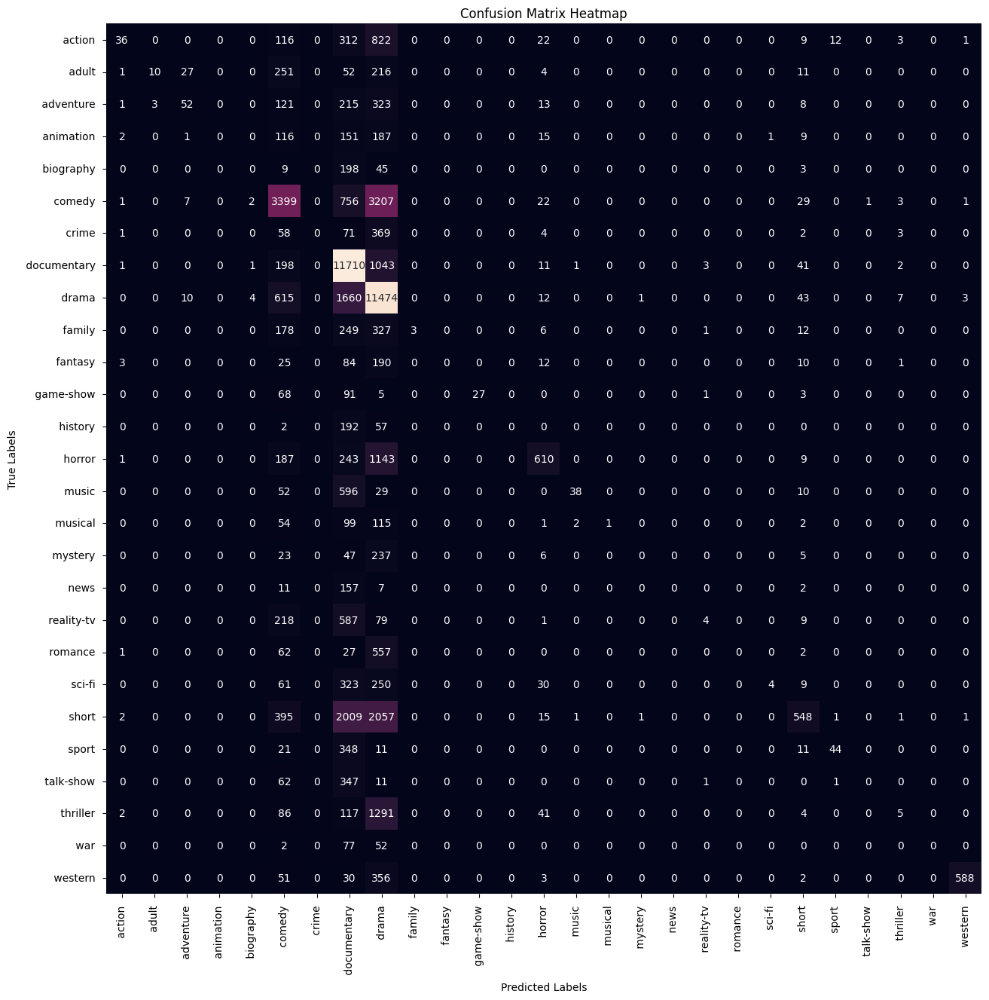

In [31]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### LogisticRegression with TfidfVectorizer

Model Score on Training data 0.9974173077277843
Model Score on Training data 0.5714575608316269
               precision    recall  f1-score   support

      action        0.33      0.43      0.37      1009
       adult        0.41      0.57      0.48       404
   adventure        0.24      0.39      0.29       447
   animation        0.17      0.44      0.24       188
   biography        0.01      0.08      0.02        37
      comedy        0.59      0.53      0.56      8219
       crime        0.07      0.20      0.11       191
 documentary        0.79      0.71      0.75     14515
       drama        0.68      0.57      0.62     16620
      family        0.16      0.33      0.22       374
     fantasy        0.13      0.40      0.19       102
   game-show        0.64      0.81      0.72       154
     history        0.02      0.10      0.03        50
      horror        0.58      0.62      0.60      2052
       music        0.53      0.65      0.58       596
     musical        0.0

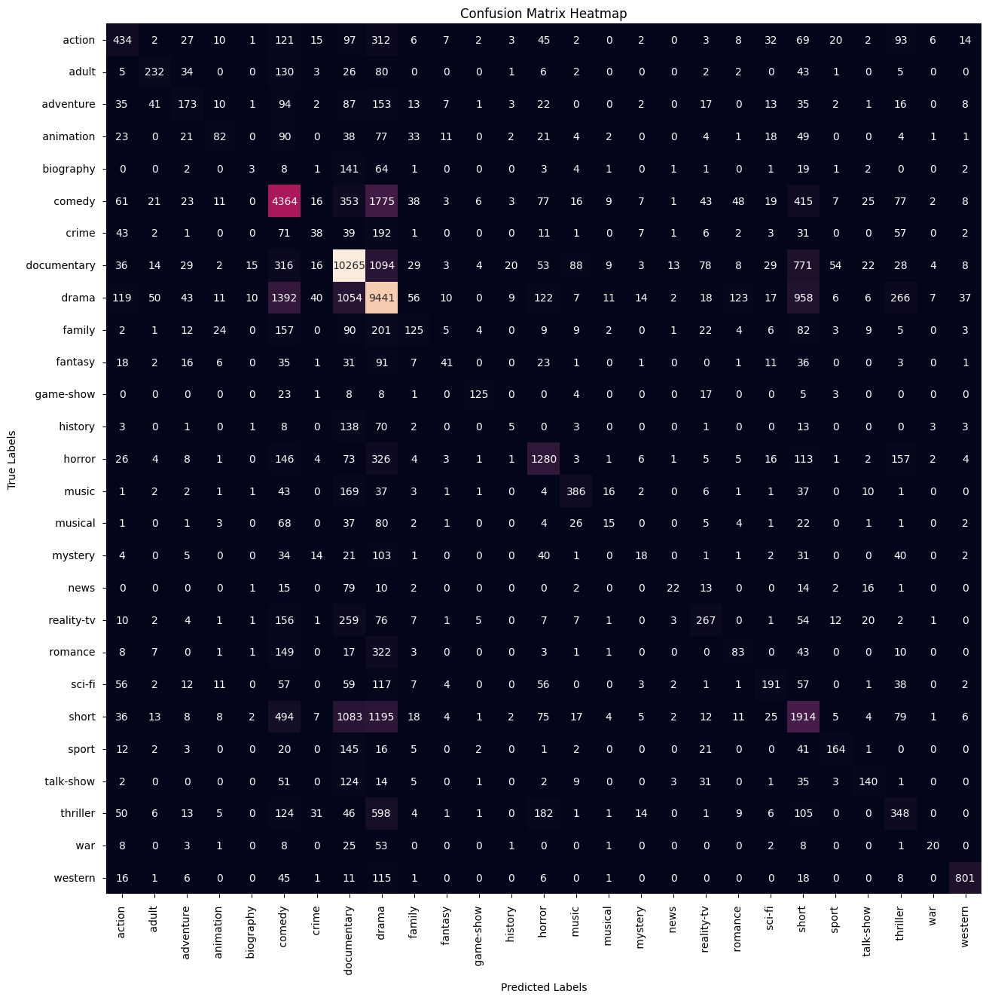

In [32]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### Support Vector Machine ( SVC ) with TfidfVectorizer

Model Score on Training data 0.9996679395650009
Model Score on Training data 0.5198406109912004
               precision    recall  f1-score   support

      action        0.29      0.33      0.31      1176
       adult        0.42      0.49      0.46       493
   adventure        0.24      0.32      0.27       560
   animation        0.17      0.31      0.22       263
   biography        0.02      0.05      0.03       111
      comedy        0.53      0.50      0.52      7917
       crime        0.06      0.11      0.08       300
 documentary        0.73      0.69      0.71     13743
       drama        0.60      0.54      0.57     15181
      family        0.16      0.24      0.19       518
     fantasy        0.09      0.17      0.12       181
   game-show        0.64      0.68      0.66       184
     history        0.04      0.08      0.05       111
      horror        0.55      0.56      0.55      2143
       music        0.49      0.55      0.52       652
     musical        0.0

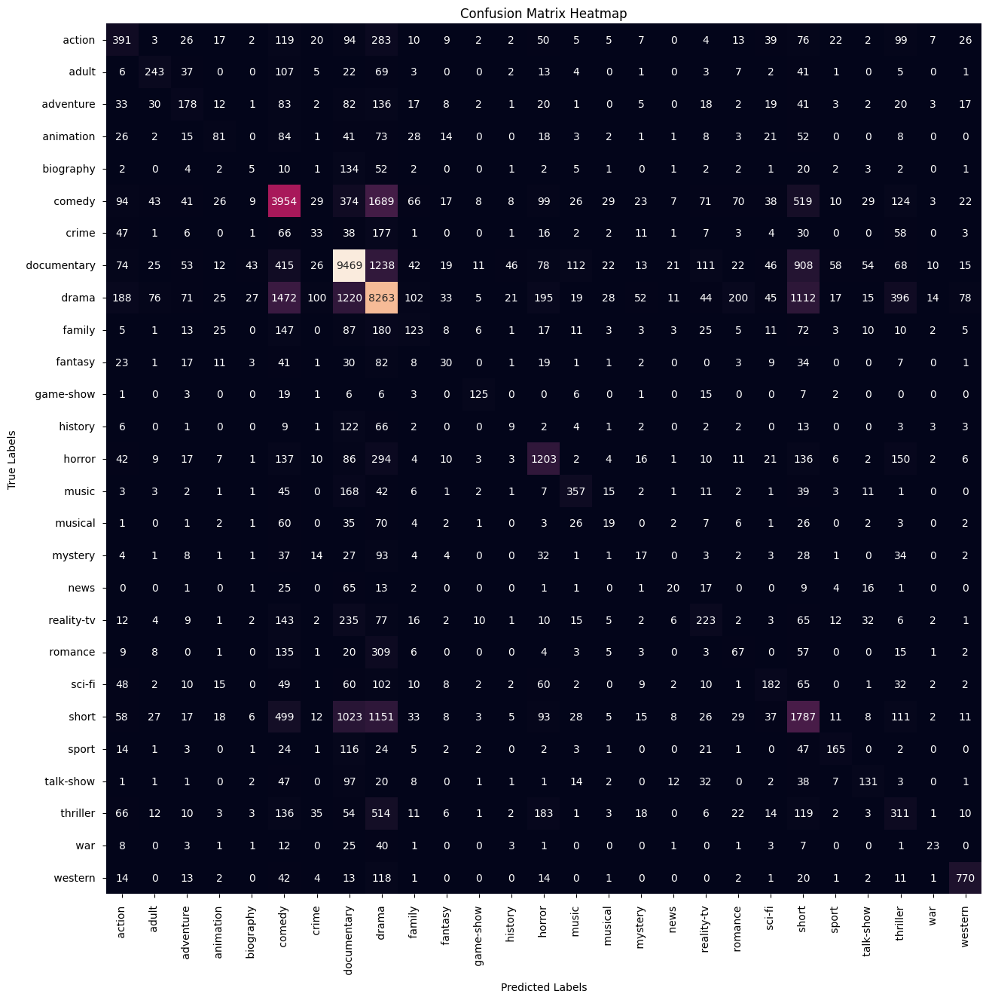

In [33]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()